### Dashboard with Dash For California Influenza Surveillance

#### Import Libraries

In [2]:
import pandas as pd
import numpy as np
import pyspark.pandas as ps
from pyspark.sql import SparkSession
from pyspark import SparkContext,SparkConf
import time
import pyarrow
import os
from pyspark.sql.types import *
from pyspark.sql.functions import *
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.plotting.backend = "plotly"
import plotly.express as px
import geopandas as gpd
import plotly.graph_objects as go
from dash import Dash, html, dcc ,Input, Output,dash_table
from jupyter_dash import JupyterDash
from PIL import Image

#### Creating spark session

In [2]:
# Create Spark Session
conf=SparkConf()
sc=SparkContext(conf=conf)

# Stop default sc
sc.stop()
spark = SparkSession \
    .builder \
    .master("spark://Kirtis-MBP.attlocal.net:7077") \
    .appName("Dashboard_With_Spark_Pandas_Api") \
    .config("spark.executor.memory",'2g') \
    .getOrCreate()


Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).


23/02/22 13:32:13 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable


In [3]:
spark

#### Version imformation:

In [4]:
## Version Information
print("Spark", spark.version)
print("Hadoop",spark.sparkContext._jvm.org.apache.hadoop.util.VersionInfo.getVersion())
print()

! python --version
print("PyArrow",pyarrow.__version__)
print("Pandas",pd.__version__)
print("NumPy",np.__version__)
print()

! java --version
!pip show dash
!pip show jupyter-dash

Spark 3.3.0
Hadoop 3.3.2

Python 3.9.7
PyArrow 10.0.1
Pandas 1.4.4
NumPy 1.21.5

java 18.0.1.1 2022-04-22
Java(TM) SE Runtime Environment (build 18.0.1.1+2-6)
Java HotSpot(TM) 64-Bit Server VM (build 18.0.1.1+2-6, mixed mode, sharing)
Name: dash
Version: 2.8.1
Summary: A Python framework for building reactive web-apps. Developed by Plotly.
Home-page: https://plotly.com/dash
Author: Chris Parmer
Author-email: chris@plotly.com
License: MIT
Location: /opt/anaconda3/lib/python3.9/site-packages
Requires: dash-core-components, dash-html-components, dash-table, Flask, plotly
Required-by: dash-bio, dash-bootstrap-components, dash-daq, jupyter-dash
Name: jupyter-dash
Version: 0.4.2
Summary: Dash support for the Jupyter notebook interface
Home-page: https://github.com/plotly/jupyter-dash
Author: Plotly
Author-email: 
License: MIT
Location: /opt/anaconda3/lib/python3.9/site-packages
Requires: ansi2html, dash, flask, ipykernel, ipython, nest-asyncio, requests, retrying
Required-by: 


### Verify that we are accessing the data file:

In [5]:
data_path="/Users/Kirtikamerkar/Austincapitaldata/data//influenza-surveillance-jtpkmr/influenza.csv"
print(os.path.isfile(data_path))

True


In [6]:
## Verify that we are accessing the data file

data_folder = "/Users/Kirtikamerkar/Austincapitaldata/data"
data_path=data_folder+"/influenza-surveillance-jtpkmr/influenza.csv"
print(f"The file at `{data_path}` {'exists' if os.path.isfile(data_path) else 'does NOT exist! Check your path'}.")

The file at `/Users/Kirtikamerkar/Austincapitaldata/data/influenza-surveillance-jtpkmr/influenza.csv` exists.


#### Loading Dataset:

In [7]:
#Loading influenza data
influenza_psdf=ps.read_csv(data_path)

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning: If `index_col` is not specified for `read_csv`, the default index is attached which can cause additional overhead.
  warnings.warn(message, PandasAPIOnSparkAdviceWarning)


#### Checking dataset fields:

In [9]:
influenza_psdf.head()

,Season,Date_Code,Weekending,Region,Respiratory_Virus,Number_Positive,Specimens_Tested,Percent_Positive
0,2009-2010,200940,10/10/09,Bay Area,Influenza_A,36,220,16.36
1,2009-2010,200940,10/10/09,Bay Area,Influenza_B,0,220,0.00
2,2009-2010,200940,10/10/09,Bay Area,Total_Influenza,36,220,16.36
3,2009-2010,200940,10/10/09,Bay Area,RSV,0,190,0.00
4,2009-2010,200940,10/10/09,California,Influenza_A,1077,3324,32.40


In [11]:
influenza_psdf.describe()

,date_code,Number_Positive,Specimens_Tested,Percent_Positive
count,50011.000000,50011.000000,50011.000000,42414.000000
mean,201658.047570,20.653936,351.877027,3.943707
std,263.947403,91.746507,611.778964,7.121999
min,200940.000000,0.000000,0.000000,0.000000
25%,201507.000000,0.000000,40.000000,0.000000
50%,201707.000000,1.000000,133.000000,0.710000
75%,201849.000000,7.000000,400.000000,4.550000
max,202039.000000,3120.000000,8013.000000,100.000000


In [12]:
influenza_psdf.dtypes

season                object
date_code              int32
weekending            object
region                object
Respiratory_Virus     object
Number_Positive        int32
Specimens_Tested       int32
Percent_Positive     float64
dtype: object

#### Renaming Column names which are not in proper format:

In [8]:
#Renaming column names
influenza_psdf=influenza_psdf.rename(columns={"season": "Season", "date_code": "Date_Code",'weekending':'Weekending',"region":"Region"})
influenza_psdf.head()

,Season,Date_Code,Weekending,Region,Respiratory_Virus,Number_Positive,Specimens_Tested,Percent_Positive
0,2009-2010,200940,10/10/09,Bay Area,Influenza_A,36,220,16.36
1,2009-2010,200940,10/10/09,Bay Area,Influenza_B,0,220,0.00
2,2009-2010,200940,10/10/09,Bay Area,Total_Influenza,36,220,16.36
3,2009-2010,200940,10/10/09,Bay Area,RSV,0,190,0.00
4,2009-2010,200940,10/10/09,California,Influenza_A,1077,3324,32.40


In [9]:
influenza_psdf.loc[(influenza_psdf['Number_Positive'] == 0) & (influenza_psdf['Specimens_Tested'] ==0)].count()

Season               7597
Date_Code            7597
Weekending           7597
Region               7597
Respiratory_Virus    7597
Number_Positive      7597
Specimens_Tested     7597
Percent_Positive        0
dtype: int64

In [75]:
influenza_pivot=influenza_psdf.pivot(index="Respiratory_Virus",columns="Season",values="Number_Positive")

In [76]:
influenza_pivot

Season,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020
Respiratory_Virus,,,,,,,,,,,
Parainfluenza_3,NaN,NaN,NaN,NaN,2.0,4.0,1,11,0,0,0
Parainfluenza_UnknownType,NaN,NaN,NaN,NaN,0.0,0.0,0,0,0,0,0
Total_Parainfluenza,NaN,NaN,NaN,NaN,9.0,7.0,8,12,21,5,17
Coronavirus_229E,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
Coronavirus_NL63,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
Total_Influenza,36.0,0.0,0.0,3.0,0.0,5.0,3,6,15,7,11
Enterovirus_Rhinovirus,NaN,NaN,NaN,NaN,41.0,41.0,17,30,42,53,80
Total_Coronavirus,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0
Influenza_B,0.0,0.0,0.0,1.0,0.0,3.0,1,1,1,1,4


#### Replacing All Nan values with zero using fillna()

In [12]:
influenza_pivot=influenza_pivot.fillna(0)

#### Removing All Rows with all columns values with zero  

In [13]:
influenza_pivot=influenza_pivot.to_pandas().loc[~(influenza_pivot.to_pandas()==0).all(axis=1)]

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning: `to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.
  warnings.warn(message, PandasAPIOnSparkAdviceWarning)
/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning: `to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.
  warnings.warn(message, PandasAPIOnSparkAdviceWarning)


In [14]:
influenza_pivot

Season,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020
Respiratory_Virus,,,,,,,,,,,
Parainfluenza_3,0,0,0,0,2,4,1,11,0,0,0
Total_Parainfluenza,0,0,0,0,9,7,8,12,21,5,17
Total_Influenza,36,0,0,3,0,5,3,6,15,7,11
Enterovirus_Rhinovirus,0,0,0,0,41,41,17,30,42,53,80
Influenza_B,0,0,0,1,0,3,1,1,1,1,4
Influenza_A,36,0,0,2,0,2,2,5,14,6,7
Parainfluenza_1,0,0,0,0,6,0,7,0,21,0,14
Parainfluenza_2,0,0,0,0,1,3,0,1,0,4,0
Adenovirus,0,0,0,0,2,4,2,1,4,4,5


In [15]:
influenza_pivot

Season,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020
Respiratory_Virus,,,,,,,,,,,
Parainfluenza_3,0,0,0,0,2,4,1,11,0,0,0
Total_Parainfluenza,0,0,0,0,9,7,8,12,21,5,17
Total_Influenza,36,0,0,3,0,5,3,6,15,7,11
Enterovirus_Rhinovirus,0,0,0,0,41,41,17,30,42,53,80
Influenza_B,0,0,0,1,0,3,1,1,1,1,4
Influenza_A,36,0,0,2,0,2,2,5,14,6,7
Parainfluenza_1,0,0,0,0,6,0,7,0,21,0,14
Parainfluenza_2,0,0,0,0,1,3,0,1,0,4,0
Adenovirus,0,0,0,0,2,4,2,1,4,4,5


In [16]:
fig=influenza_pivot.plot().update_layout(yaxis_title="Number Of Positive Cases")
fig.show()

In [17]:
figp=influenza_pivot[["2009-2010"]].plot().update_layout(yaxis_title="Number Of Positive Cases")
figp.show()

In [18]:
influenza_pivot

Season,2009-2010,2010-2011,2011-2012,2012-2013,2013-2014,2014-2015,2015-2016,2016-2017,2017-2018,2018-2019,2019-2020
Respiratory_Virus,,,,,,,,,,,
Parainfluenza_3,0,0,0,0,2,4,1,11,0,0,0
Total_Parainfluenza,0,0,0,0,9,7,8,12,21,5,17
Total_Influenza,36,0,0,3,0,5,3,6,15,7,11
Enterovirus_Rhinovirus,0,0,0,0,41,41,17,30,42,53,80
Influenza_B,0,0,0,1,0,3,1,1,1,1,4
Influenza_A,36,0,0,2,0,2,2,5,14,6,7
Parainfluenza_1,0,0,0,0,6,0,7,0,21,0,14
Parainfluenza_2,0,0,0,0,1,3,0,1,0,4,0
Adenovirus,0,0,0,0,2,4,2,1,4,4,5


In [19]:
fig1=influenza_pivot.plot.barh()
fig1.update_layout(xaxis_title="Number Of Positive Cases")
fig1.show()

In [20]:
fig2=influenza_pivot.plot.bar()
fig2.update_layout(yaxis_title="Number Of Positive Cases")
fig2.show()

In [21]:
influenza_pivot_region=influenza_psdf.pivot(index="Respiratory_Virus",columns="Region",values="Number_Positive")

In [27]:
influenza_pivot_region.head()

Region,Bay Area,California,Central,Lower Southern,Northern,Northern/Bay Area,Upper Southern,Upper/Lower Southern
Respiratory_Virus,,,,,,,,
Parainfluenza_3,2,4,1,0,0,NaN,1,0
Parainfluenza_UnknownType,0,0,0,0,0,NaN,0,0
Total_Parainfluenza,9,35,11,0,7,NaN,8,0
Coronavirus_229E,0,0,0,0,0,NaN,0,0
Coronavirus_NL63,0,0,0,0,0,NaN,0,0


In [28]:
#Replacing Nan with Zero
influenza_pivot_region=influenza_pivot_region.fillna(0)

In [29]:
#Removing rows with all zero value
influenza_pivot_region=influenza_pivot_region.to_pandas().loc[~(influenza_pivot_region.to_pandas()==0).all(axis=1)]

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



In [30]:
influenza_pivot_region

Region,Bay Area,California,Central,Lower Southern,Northern,Northern/Bay Area,Upper Southern,Upper/Lower Southern
Respiratory_Virus,,,,,,,,
Parainfluenza_3,2,4,1,0,0,0,1,0
Total_Parainfluenza,9,35,11,0,7,0,8,0
Total_Influenza,36,1080,203,21,0,628,17,175
Enterovirus_Rhinovirus,41,88,28,0,0,0,19,0
Total_Coronavirus,0,2,0,0,0,0,0,2
Influenza_B,0,3,1,0,0,1,0,1
Influenza_A,36,1077,202,21,0,627,17,174
Parainfluenza_1,6,24,6,0,7,0,5,0
Parainfluenza_2,1,1,0,0,0,0,0,0


In [31]:
fig3=influenza_pivot_region.plot.bar()
fig3.update_layout(yaxis_title='Number_Positive')
fig3.show()

In [32]:
fig4=influenza_pivot_region.plot.barh()
fig4.update_layout(xaxis_title='Number_Positive')
fig4.show()

In [33]:
fig5= px.pie(influenza_psdf.to_pandas(), values='Number_Positive', names='Respiratory_Virus', title='Number of Positive Cases for each Respiratory Virus')

fig5.show()

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



In [29]:
influenza_pivot_region1=influenza_psdf.pivot(index="Region",columns="Respiratory_Virus",values="Specimens_Tested")

In [30]:
fig6=influenza_pivot_region1.plot.barh()
fig6.update_layout(xaxis_title='Specimens_Tested')
fig6.show()

In [31]:
fig7=influenza_pivot_region1.plot.line()
fig7.update_layout(yaxis_title='Specimens_Tested')
fig7.show()

In [32]:
from geopy.exc import GeocoderTimedOut
from geopy.geocoders import Nominatim
# declare an empty list to store
# latitude and longitude of values 
# of Region column
longitude = []
latitude = []
    #function to find the coordinate
# of a given region
# Define a dictionary containing  data 
data = {'Region':['Northern/Bay Area','Northern','Bay Area','Lower Southern','Upper/Lower Southern','Central','Upper Souther','California']} 
    
# Convert the dictionary into DataFrame 
df = pd.DataFrame(data) 
    
# Observe the result 
df 

def findGeocode(Region):
       
    # try and catch is used to overcome
    # the exception thrown by geolocator
    # using geocodertimedout  
    try:
          
        # Specify the user_agent as your
        # app name it should not be none
        geolocator = Nominatim(timeout=10,user_agent="Loading_Data_Spark_Pandas_Api")
          
        return geolocator.geocode(Region)
      
    except GeocoderTimedOut:
          
        return findGeoCode(Region)
          
           
# each value from city column
# will be fetched and sent to
# function find_geocode   
for i in (df["Region"]):
      
    if findGeocode(i) != None:
           
        loc = findGeocode(i)
          
        # coordinates returned from 
        # function is stored into
        # two separate list
        latitude.append(loc.latitude)
        longitude.append(loc.longitude)
       
    # if coordinate for a region not
    # found, insert "NaN" indicating 
    # missing value 
    else:
        latitude.append(np.nan)
        longitude.append(np.nan)

In [33]:
df["Longitude"] = longitude
df["Latitude"] = latitude
df

,Region,Longitude,Latitude
0,Northern/Bay Area,-122.355847,37.788497
1,Northern,-0.394380,9.660001
2,Bay Area,-122.355847,37.788497
3,Lower Southern,-117.777965,33.726522
4,Upper/Lower Southern,-119.770547,34.549755
5,Central,-1.376175,5.724415
6,Upper Souther,NaN,NaN
7,California,-118.755997,36.701463


In [35]:
#Merging df with influenza_pivot_region1
merge=pd.merge(influenza_pivot_region1.to_pandas(),df,on='Region')
merge

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



,Region,Adenovirus,Coronavirus_229E,Coronavirus_HKU1,Coronavirus_NL63,Coronavirus_OC43,Coronavirus_UnknownType,Enterovirus_Rhinovirus,HMPV,Influenza_A,...,Parainfluenza_2,Parainfluenza_3,Parainfluenza_4,Parainfluenza_UnknownType,RSV,Total_Coronavirus,Total_Influenza,Total_Parainfluenza,Longitude,Latitude
0,Northern/Bay Area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1510,...,NaN,NaN,NaN,NaN,1510,NaN,1510,NaN,-122.355847,37.788497
1,Northern,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,35.0,35.0,35.0,35.0,0,0.0,0,35.0,-0.394380,9.660001
2,Lower Southern,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150,...,0.0,0.0,0.0,0.0,35,0.0,150,0.0,-117.777965,33.726522
3,Central,73.0,103.0,103.0,103.0,103.0,103.0,73.0,73.0,787,...,103.0,103.0,103.0,103.0,329,103.0,787,103.0,-1.376175,5.724415
4,Upper/Lower Southern,0.0,328.0,328.0,328.0,328.0,328.0,0.0,0.0,499,...,0.0,0.0,0.0,0.0,11,328.0,499,0.0,-119.770547,34.549755
5,Bay Area,152.0,0.0,0.0,0.0,0.0,0.0,152.0,152.0,220,...,198.0,198.0,198.0,198.0,190,0.0,220,198.0,-122.355847,37.788497
6,California,266.0,519.0,519.0,519.0,519.0,519.0,406.0,266.0,3324,...,447.0,447.0,447.0,447.0,2218,519.0,3324,447.0,-118.755997,36.701463


In [36]:
map_df=gpd.GeoDataFrame(merge)
map_df

,Region,Adenovirus,Coronavirus_229E,Coronavirus_HKU1,Coronavirus_NL63,Coronavirus_OC43,Coronavirus_UnknownType,Enterovirus_Rhinovirus,HMPV,Influenza_A,...,Parainfluenza_2,Parainfluenza_3,Parainfluenza_4,Parainfluenza_UnknownType,RSV,Total_Coronavirus,Total_Influenza,Total_Parainfluenza,Longitude,Latitude
0,Northern/Bay Area,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1510,...,NaN,NaN,NaN,NaN,1510,NaN,1510,NaN,-122.355847,37.788497
1,Northern,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,...,35.0,35.0,35.0,35.0,0,0.0,0,35.0,-0.394380,9.660001
2,Lower Southern,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,150,...,0.0,0.0,0.0,0.0,35,0.0,150,0.0,-117.777965,33.726522
3,Central,73.0,103.0,103.0,103.0,103.0,103.0,73.0,73.0,787,...,103.0,103.0,103.0,103.0,329,103.0,787,103.0,-1.376175,5.724415
4,Upper/Lower Southern,0.0,328.0,328.0,328.0,328.0,328.0,0.0,0.0,499,...,0.0,0.0,0.0,0.0,11,328.0,499,0.0,-119.770547,34.549755
5,Bay Area,152.0,0.0,0.0,0.0,0.0,0.0,152.0,152.0,220,...,198.0,198.0,198.0,198.0,190,0.0,220,198.0,-122.355847,37.788497
6,California,266.0,519.0,519.0,519.0,519.0,519.0,406.0,266.0,3324,...,447.0,447.0,447.0,447.0,2218,519.0,3324,447.0,-118.755997,36.701463


In [37]:
fig8 = px.scatter_mapbox(map_df, lat="Latitude", lon="Longitude", hover_name="Region", hover_data=["Influenza_A","Influenza_B","Total_Influenza",'RSV'],
                        color_discrete_sequence=["fuchsia"], zoom=3, height=300)
fig8.update_geos(
    visible=False, resolution=110, scope="usa",
    showcountries=True, countrycolor="Black",
    showsubunits=True, subunitcolor="Blue"
)
fig8.update_layout(mapbox_style="open-street-map")
fig8.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig8.update_layout(mapbox_bounds={"west": -180, "east": -50, "south": 20, "north": 90})
fig8.show()


In [38]:
color_scale = [(0, 'orange'), (1,'red')]
fig9 = px.scatter_mapbox(map_df, 
                        lat="Latitude", 
                        lon="Longitude", 
                        hover_name="Region", 
                        hover_data=["Influenza_A",'Influenza_B',"RSV"],
                        color="Region",
                        color_continuous_scale=color_scale,
                        zoom=3, 
                        height=300)

fig9.update_geos(
    visible=False, resolution=110, scope="usa",
    showcountries=True, countrycolor="Black",
    showsubunits=True, subunitcolor="Blue"
)
fig9.update_layout(mapbox_style="open-street-map")
fig9.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig9.update_layout(mapbox_bounds={"west": -180, "east": -50, "south": 20, "north": 90})
fig9.show()

In [ ]:
gdf.columns

#### Plot Number of positive cases per Region for each respiratory virus varies according to season

In [39]:
fig10= px.bar(influenza_psdf.to_pandas(),"Region","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 40000])
fig10.show()

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



In [26]:
df=influenza_psdf.to_pandas()
df=df[(df['Season']=='2009-2010')&(df['Region']=='Bay Area')&(df['Respiratory_Virus']=='Influenza_A')]
fig= px.line(df,"Weekending","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 100])
fig.show()


/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



In [27]:
df=influenza_psdf.to_pandas()
df=df[(df['Season']=='2009-2010')&(df['Region']=='Bay Area')]
fig5= px.pie(df, values='Number_Positive', names='Respiratory_Virus', title='Number of Positive Cases for each Respiratory Virus')

fig5.show()


/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



#### DashBoard Design with JupyterDash:
- ###### Step 1:Installation
  - In your Terminal install Dash and JupyterDash with pip install commands
    - pip install dash
    - pip install jupyter_dash
    - Here we are using dash Version: 2.8.1 and jupyter-dash Version: 0.4.2  which is supported by python 3
- ###### Step 2:Dash Layout   
  - Dash apps are composed of two parts. The first part is the "layout", which describes what the app looks like. The second part describes the interactivity of the app.
    - import libraries needed: 
      - from dash import Dash, html, dcc
      - import plotly.express as px
      - import pandas as pd
      - from jupyter_dash import JupyterDash
    - Create app as
      - app = Dash(__name__)
      - app = JupyterDash(__name__) if you will be using Jupyter_dash(I am using Jupyter dash)
    - Create layout with app.layout  
    - Call dataset in app 
   - The layout is composed of a tree of "components" such as html.Div and dcc.Graph.
   - Calling app with 
      - if __name__=='__main__':
           app.run_server(debug=True)
    - Run your app with jupyter notebook or app.py through terminal
    - Click on link: Dash app running on http://127.0.0.1:8050/
    You dashbord is ready.
- The Dash HTML Components module (dash.html)has a component for every HTML tag.
- Not all components are pure HTML. The Dash Core Components module (dash.dcc) contains higher-level components that are interactive and are generated with JavaScript, HTML, and CSS through the React.js library.

- Each component is described entirely through keyword attributes. Dash is declarative: you will primarily describe your app through these attributes.

- The children property is special. By convention, it's always the first attribute which means that you can omit it: html.H1(children='Hello Dash') is the same as html.H1('Hello Dash'). It can contain a string, a number, a single component, or a list of components.
- The fonts in your app will look a little bit different than what is displayed here. This app is using a custom CSS stylesheet and Dash Enterprise Design Kit to modify the default styles of the elements. 

In [ ]:
app.layout=html.Div(     #A Div component. Div is a wrapper for the <div> HTML5 element. 
   children=[ #children (list of or a singular dash component, string or number; optional): The children of this component.
       html.H4(children="heading"),
       html.div(children= ,style= {}),
       dcc.Graph(
        id=" ",
        figure=fig)
   ])
#children (list of or a singular dash component, string or number; optional): The children of this component.

#id (string; optional): The ID of this component, used to identify dash components in callbacks. The ID needs to be unique across all of the components in an app.
#The Dash Core Components module (dash.dcc) gives you access to many interactive components, including dropdowns, checklists, and sliders.

##### Example 1: configuring heading,paragraph and dropdowns

In [44]:
from dash import Dash, dcc, html, Input, Output
app = JupyterDash(__name__)
app.layout=html.Div([
    html.H1('Hello Dash'),
    html.Div([
        html.P('Dash converts Python classes into HTML'),
        html.P("This conversion happens behind the scenes by Dash's JavaScript front-end")
    ]),
      dcc.Dropdown(['New York City', 'Montréal', 'San Francisco'], 'Montréal',id='demo-dropdown'),
     html.Div(id='dd-output-container')
])


@app.callback(
    Output('dd-output-container', 'children'),
    Input('demo-dropdown', 'value')
)
def update_output(value):
    return f'You have selected {value}'

if __name__ == '__main__':
    app.run_server(debug=True)

Dash app running on http://127.0.0.1:8050/


In [ ]:
app = JupyterDash(__name__)
app.layout=html.Div([
    html.Div('Example Div', style={'color': 'blue', 'fontSize': 25,'textAlign': 'center'}),
    html.P('Example P', className='my-class', id='my-p-element')
], style={'marginBottom': 50, 'marginTop': 25,'textAlign': 'center','fontSize': 20})
if __name__ == '__main__':
    app.run_server(debug=True)

##### Example2: How to input and output value.

In [ ]:
app = JupyterDash(__name__)
app.layout = html.Div([
    html.H6("Change the value in the text box to see callbacks in action!"),
    html.Div([
        "Input: ",
        dcc.Input(id='my-input', value='initial value', type='text')
    ]),
    html.Br(),
    html.Div(id='my-output'),

])

@app.callback(
    Output(component_id='my-output', component_property='children'),
    Input(component_id='my-input', component_property='value')
)

def update_output_div(input_value):
    return f'Output: {input_value}'

if __name__ == '__main__':
    app.run_server(debug=True)

In [ ]:

#Create app
app = JupyterDash(__name__)
df = pd.DataFrame({'student_id' : range(1, 11),'score' : [1, 5, 2, 5, 2, 3, 1, 5, 1, 5]})

app.layout = html.Div([
    dcc.Dropdown(list(range(1, 6)), 1, id='score'),
    'was scored by this many students:',
    html.Div(id='output'),
])

@app.callback(Output('output', 'children'), Input('score', 'value'))
def update_output(value):
    global df
    df = df[df['score'] == value]
    return len(df)
if __name__ == '__main__':
    app.run_server(debug=True)

#### Example3: Dashboard California's Influenza Surveillance with linechart,piechart and barhchart 

In [ ]:
#Create app
app = JupyterDash(__name__)
# Creating layout
app.layout = html.Div(children=[
    html.H4(children="Californi's Influenza Surveillance"),

    html.Div(children='''
        Influenza Positive Tests Reported to CDC.
    ''',
    style={
            'textAlign': 'center'
        }),
    #Calling linegraph from pyspark
    html.Div(                  
    dcc.Graph(
        id='linechart',
        figure=fig,
       
    )),
    #Calling piechart from pyspark
    html.Div(
    dcc.Graph(
      id='pieChart',
    figure=fig5
    )),
    #Calling barhchart from pyspark
    html.Div(
    dcc.Graph(
      id='barhchart',
    figure=fig1,
    ))
])



if __name__ == '__main__':
    app.run_server(debug=True)

##### Example4 :Calling data from datatables and updating graphs

In [ ]:
#Create app
app = JupyterDash(__name__)
df=influenza_psdf.to_pandas()
# Creating layout
app.layout = html.Div([
    dash_table.DataTable(
        id='datatable-interactivity',
        columns=[
            {"name": i, "id": i, "deletable": True, "selectable": True} for i in df.columns
        ],
        data=df.to_dict('records'),
        editable=True,
        filter_action="native",
        sort_action="native",
        sort_mode="multi",
        column_selectable="single",
        row_selectable="multi",
        row_deletable=True,
        selected_columns=[],
        selected_rows=[],
        page_action="native",
        page_current= 0,
        page_size= 10,
    ),
    html.Div(id='datatable-interactivity-container')
])
@app.callback(
    Output('datatable-interactivity', 'style_data_conditional'),
    Input('datatable-interactivity', 'selected_columns')
)
def update_styles(selected_columns):
    return [{
        'if': { 'column_id': i },
        'background_color': '#D2F3FF'
    } for i in selected_columns]

@app.callback(
    Output('datatable-interactivity-container', "children"),
    Input('datatable-interactivity', "derived_virtual_data"),
    Input('datatable-interactivity', "derived_virtual_selected_rows"))
def update_graphs(rows, derived_virtual_selected_rows):
    # When the table is first rendered, `derived_virtual_data` and
    # `derived_virtual_selected_rows` will be `None`. This is due to an
    # idiosyncrasy in Dash (unsupplied properties are always None and Dash
    # calls the dependent callbacks when the component is first rendered).
    # So, if `rows` is `None`, then the component was just rendered
    # and its value will be the same as the component's dataframe.
    # Instead of setting `None` in here, you could also set
    # `derived_virtual_data=df.to_rows('dict')` when you initialize
    # the component.
    if derived_virtual_selected_rows is None:
        derived_virtual_selected_rows = []

    dff = df if rows is None else pd.DataFrame(rows)

    colors = ['#7FDBFF' if i in derived_virtual_selected_rows else '#0074D9'
              for i in range(len(dff))]

    return [
        dcc.Graph(
            id=column,
            figure={
                "data": [
                    {
                        "x": dff["Respiratory_Virus"],
                        "y": dff[column],
                        "type": "bar",
                        "marker": {"color": colors},
                    }
                ],
                "layout": {
                    "xaxis": {"automargin": True},
                    "yaxis": {
                        "automargin": True,
                        "title": {"text": column}
                    },
                    "height": 250,
                    "margin": {"t": 10, "l": 10, "r": 10},
                },
            },
        )
        # check if column exists - user may have deleted it
        # If `column.deletable=False`, then you don't
        # need to do this check.
        for column in ["Number_Positive", "Specimens_Tested", "Percent_Positive"] if column in dff
    ]



if __name__ == '__main__':
    app.run_server(debug=True)

In [ ]:
#Loading Datatable
from dash import Dash, dash_table
import pandas as pd

df = pd.read_csv(data_path)

app = JupyterDash(__name__)

app.layout = dash_table.DataTable(df.to_dict('records'), [{"name": i, "id": i} for i in df.columns])

if __name__ == '__main__':
    app.run_server(debug=True)

In [ ]:
#Loading datatable
from dash import Dash, dash_table
import pandas as pd

df = influenza_psdf.to_pandas()

app = JupyterDash(__name__)

app.layout = dash_table.DataTable(df.to_dict('records'), [{"name": i, "id": i} for i in df.columns])

if __name__ == '__main__':
    app.run_server(debug=True)

In [ ]:
from dash import Dash, dash_table
import pandas as pd

df = pd.read_csv(data_path)

app = JupyterDash(__name__)

dcc.Checklist(df.region.unique(), df.region.unique()[0:5])
if __name__ == '__main__':
    app.run_server(debug=True)

In [ ]:
from dash import dcc, html

dcc.Checklist(
    [
        {
            "label": html.Div(['Montreal'], style={'color': 'Gold', 'font-size': 20}),
            "value": "Montreal",
        },
        {
            "label": html.Div(['NYC'], style={'color': 'MediumTurqoise', 'font-size': 20}),
            "value": "NYC",
        },
        {
            "label": html.Div(['London'], style={'color': 'LightGreen', 'font-size': 20}),
            "value": "London",
        },
    ], value=['Montreal']
)


#### Interactive dropdowns handling values from dataframe

In [66]:
#Create app
app = JupyterDash(__name__)
df=influenza_psdf.to_pandas()
image_path='/Users/kirtikamerkar/Austincapitaldata/virusgraph/assets/ACD.png'
pil_image = Image.open(image_path)
# Creating layout
app.layout = html.Div(style={'backgroundColor':'teal'},children=[
    html.Div(html.Img(src=pil_image,style={'height':'1%','width':'5%','backgroundColor':'yellow'})),
    html.H1(children="California's Influenza Surveillance",
           style={'textAlign':'center','backgroundColor':'gold'}),

    html.Div(children=[html.H3(children='''
        Influenza Positive Tests Reported to CDC.
    ''',
    style={
            'textAlign': 'center','font':50
        }),
    #Calling data from region column
    html.Div([
      "Region",
       dcc.Dropdown(id="dropdown1",
       options=[{'label':x, 'value':x} for x in df.sort_values('Region')['Region'].unique()],optionHeight=35,
       value='California')],style={'color': 'black', 'font-size':20,"width": "10%","font-weight": "bold"})]),
        
    #Calling data from season column
    html.Div([
       "Season",
       dcc.Dropdown(id="dropdown2",
       options=[{'label':x, 'value':x} for x in df.sort_values('Season')['Season'].unique()],optionHeight=35,
       value='2019-2020')],style={'color':'black', 'font-size':20,"width": "10%","font-weight": "bold"}),
    #Calling data from respiratory_virus column
    html.Div([
       "Respiratory_Virus",
       dcc.Dropdown(id="dropdown3",
       options=[{'label':x, 'value':x} for x in df.sort_values('Respiratory_Virus')['Respiratory_Virus'].unique()],optionHeight=35,
       value='Total_Influenza')],
    style={'color': 'back', 'font-size': 20,"width": "10%","font-weight": "bold"}),
    
     html.Div([
        dcc.Graph(id='barchart',figure={}),
         ],className='six columns'),
    html.Div([
        dcc.Graph(id='piechart',figure={})
    ],className='six columns'),
    html.Div([
    html.Button("Download Data", id="btn-download"),
    dcc.Download(id="download-data")
])
    
])
@app.callback(
    Output('barchart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     Input('dropdown3','value')],
    )

def build_graph(reg_v, season_v, virus_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)&(df['Respiratory_Virus']==virus_v)]

    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
    if virus_v:
        dff=dff[dff.Respiratory_Virus.isin([virus_v])]
    
        fig= px.bar(dff,"Weekending","Number_Positive",
               color ='Respiratory_Virus',
               animation_frame ='Season',
                hover_name ='Region', 
                range_y =[0, 4000],title='Number of Positive cases per Weekending')
    else:
          fig=px.bar(df,"Weekending","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 4000])
    return fig

@app.callback(
    Output('piechart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     ]
)  
def build_graph2(reg_v,season_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
        
        dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
        fig2=px.pie(dff, values='Specimens_Tested', names='Respiratory_Virus', title='Specimens tested  for each Respiratory Virus')
    return fig2
@app.callback(
    Output("download-data", "data"),
    Input("btn-download", "n_clicks"),
    prevent_initial_call=True,)    

def func(n_clicks):
    return dcc.send_data_frame(df.to_csv, "mydf.csv")
if __name__ == '__main__':
    app.run_server(debug=True)

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



Dash app running on http://127.0.0.1:8050/


In [67]:
app = JupyterDash(__name__)
df=influenza_psdf.to_pandas()
# Creating layout
app.layout =html.Div(children=[
    html.H1(children="California's Influenza Surveillance",
           style={'textAlign':'center'}),

    html.Div(children=[html.H3(children='''
        Influenza Positive Tests Reported to CDC.
    ''',
    style={
            'textAlign': 'center','font':50
        })]),
                       
    html.Div(className='row',
         style = {'display' : 'flex'},
             children=[
        html.Div(
                dcc.Dropdown(id='dropdown1',options=[{'label':x, 'value':x} for x in df.sort_values('Region')['Region'].unique()],
       value='California'),style={'color': 'gold', 'font-size':20,"width": "10%",'backgroundColor':'black'}),
            
        html.Div(
            dcc.Dropdown(id='dropdown2',options=[{'label':x, 'value':x} for x in df.sort_values('Season')['Season'].unique()],
       value='2019-2020'),style={'color': 'gold', 'font-size':20,"width": "10%"}),
        
        html.Div(
            dcc.Dropdown(id='dropdown3',options=[{'label':x, 'value':x} for x in df.sort_values('Respiratory_Virus')['Respiratory_Virus'].unique()],
       value='Total_influenza'),style={'color': 'gold', 'font-size':20,"width": "10%"}),
        
           
        ]),
    html.Div(className='row',style={'display':'flex'},children=[
    html.Div(
        dcc.Graph(id='barchart',figure={}),
         className='six columns'),
    html.Div(
        dcc.Graph(id='piechart',figure={})
      ,className='six columns')])

]) 
@app.callback(
    Output('barchart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     Input('dropdown3','value')],
    )

def build_graph(reg_v, season_v, virus_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)&(df['Respiratory_Virus']==virus_v)]

    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
    if virus_v:
        dff=dff[dff.Respiratory_Virus.isin([virus_v])]
    
        fig= px.bar(dff,"Weekending","Number_Positive",
               color ='Respiratory_Virus',
               animation_frame ='Season',
                hover_name ='Region', 
                range_y =[0, 4000],title='Number of Positive cases per Weekending')
    else:
          fig=px.bar(df,"Weekending","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 4000])
    return fig

@app.callback(
    Output('piechart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     ]
)  
def build_graph2(reg_v,season_v):
    influenza_pivot=influenza_psdf.pivot(index="Respiratory_Virus",columns="Season",values="Number_Positive")
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
        
        dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
        fig2=px.pie(dff, values='Specimens_Tested', names='Respiratory_Virus', title='Specimens tested  for each Respiratory Virus')
    return fig2
    

if __name__ == '__main__':
    app.run_server(debug=True)  

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



Dash app running on http://127.0.0.1:8050/


### Dashboard to hover data on pie and line chart

In [13]:
app = JupyterDash(__name__)
app.layout = html.Div([
    dcc.Dropdown(id='dpdn2', value=['Bay Area','California'], multi=True,
                 options=[{'label': x, 'value': x} for x in
                          df.Region.unique()]),
    html.Div([
        dcc.Graph(id='pie-graph', figure={}, className='six columns'),
        dcc.Graph(id='my-graph', figure={}, clickData=None, hoverData=None, # I assigned None for tutorial purposes. By defualt, these are None, unless you specify otherwise.
                  config={
                      'staticPlot': False,     # True, False
                      'scrollZoom': True,      # True, False
                      'doubleClick': 'reset',  # 'reset', 'autosize' or 'reset+autosize', False
                      'showTips': False,       # True, False
                      'displayModeBar': True,  # True, False, 'hover'
                      'watermark': True,
                     
                        },
                  className='six columns'
                  )
    ])
])
@app.callback(
    Output(component_id='my-graph', component_property='figure'),
    Input(component_id='dpdn2', component_property='value'),
)
def update_graph(country_chosen):
    dff = df[df.Region.isin(country_chosen)]
    fig = px.line(data_frame=dff, x='Season', y='Number_Positive', color='Region',
                  custom_data=['Region', 'Respiratory_Virus', "Specimens_Tested", 'Number_Positive'])
    fig.update_traces(mode='lines+markers')
    return fig


# Dash version 1.16.0 or higher
@app.callback(
    Output(component_id='pie-graph', component_property='figure'),
    Input(component_id='my-graph', component_property='hoverData'),
    Input(component_id='my-graph', component_property='clickData'),
    Input(component_id='my-graph', component_property='selectedData'),
    Input(component_id='dpdn2', component_property='value')
)
def update_side_graph(hov_data, clk_data, slct_data,region_chosen):
    if hov_data is None:
        dff2 = df[df.Region.isin(region_chosen)]
        dff2 = dff2[dff2.Season == "2009-2010"]
        fig2 = px.pie(data_frame=dff2, values='Number_Positive', names='Region',
                      title='Positive cases for season 2009-2010')
        return fig2
    else:
        print(f'hover data: {hov_data}')
        # print(hov_data['points'][0]['customdata'][0])
        # print(f'click data: {clk_data}')
        # print(f'selected data: {slct_data}')
        dff2 = df[df.Region.isin(region_chosen)]
        hov_year = hov_data['points'][0]['x']
        dff2 = dff2[dff2.Season == hov_year]
        fig2 = px.pie(data_frame=dff2, values='Number_Positive', names='Region', title=f'Positive cases for: {hov_year}')
        return fig2

if __name__ == '__main__':
    app.run_server(debug=True)    

Dash app running on http://127.0.0.1:8050/
hover data: {'points': [{'curveNumber': 0, 'pointNumber': 1506, 'pointIndex': 1506, 'x': '2013-2014', 'y': 0, 'bbox': {'x0': 774.91, 'x1': 776.91, 'y0': 843.75, 'y1': 845.75}, 'customdata': ['Bay Area', 'Parainfluenza_UnknownType', 46, 0]}]}


#### Final

In [10]:
#Create app
app = JupyterDash(__name__)
df=influenza_psdf.to_pandas()
image_path='/Users/kirtikamerkar/Austincapitaldata/virusgraph/assets/ACD.png'
pil_image = Image.open(image_path)
# Creating layout
app.layout = html.Div(style={'backgroundColor':'teal'},children=[
    html.Div(html.Img(src=pil_image,style={'height':'1%','width':'5%','backgroundColor':'yellow'})),
    html.H1(children="California's Influenza Surveillance",
           style={'textAlign':'center','backgroundColor':'gold'}),

    html.Div(children=[html.H3(children='''
        Influenza Positive Tests Reported to CDC.
    ''',
    style={
            'textAlign': 'center','font':50
        }),
    #Calling data from region column
    html.Div([
      "Region",
       dcc.Dropdown(id="dropdown1",
       options=[{'label':x, 'value':x} for x in df.sort_values('Region')['Region'].unique()],optionHeight=35,
       value='California')],style={'color': 'black', 'font-size':20,"width": "10%","font-weight": "bold"})]),
        
    #Calling data from season column
    html.Div([
       "Season",
       dcc.Dropdown(id="dropdown2",
       options=[{'label':x, 'value':x} for x in df.sort_values('Season')['Season'].unique()],optionHeight=35,
       value='2019-2020')],style={'color':'black', 'font-size':20,"width": "10%","font-weight": "bold"}),
    #Calling data from respiratory_virus column
    html.Div([
       "Respiratory_Virus",
       dcc.Dropdown(id="dropdown3",
       options=[{'label':x, 'value':x} for x in df.sort_values('Respiratory_Virus')['Respiratory_Virus'].unique()],optionHeight=35,
       value='Total_Influenza')],
    style={'color': 'back', 'font-size': 20,"width": "10%","font-weight": "bold"}),
    
     html.Div(className='row',style={'display':'flex'},children=[
    html.Div(
        dcc.Graph(id='barchart',figure={}),
         className='six columns'),
    html.Div(
        dcc.Graph(id='piechart',figure={})
      ,className='six columns'),
     html.Div(
        dcc.Graph(id='linechart',figure={})
      ,className='six columns')]),

    html.Div([
    html.Button("Download Data", id="btn-download"),
    dcc.Download(id="download-data")
])
    
])
@app.callback(
    Output('barchart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     Input('dropdown3','value')],
    )

def build_graph(reg_v, season_v, virus_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)&(df['Respiratory_Virus']==virus_v)]

    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
    if virus_v:
        dff=dff[dff.Respiratory_Virus.isin([virus_v])]
    
        fig= px.bar(dff,"Weekending","Number_Positive",
               color ='Respiratory_Virus',
               animation_frame ='Season',
                hover_name ='Region', 
                range_y =[0, 4000],title='Number of Positive cases per Weekending')
    else:
          fig=px.bar(df,"Weekending","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 4000])
    return fig

@app.callback(
    Output('piechart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     ]
)  
def build_graph2(reg_v,season_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
        
        dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
        fig2=px.pie(dff, values='Specimens_Tested', names='Respiratory_Virus', title='Specimens tested  for each Respiratory Virus')
    return fig2
@app.callback(
    Output('linechart','figure'),Input('dropdown2','value')
)

def build_graph3(season_v):
    dff = influenza_psdf.pivot(index="Respiratory_Virus",columns="Season",values="Percent_Positive")
    dff=dff.fillna(0)
    dff=dff.to_pandas().loc[~(dff.to_pandas()==0).all(axis=1)]
    #figp=influenza_pivot[["2009-2010"]].plot().update_layout(yaxis_title="Number Of Positive Cases")
    if season_v:
        fig3=dff[[season_v]].plot().update_layout(yaxis_title="Percentage_Positive",title='Percentage positive cases per selected season')
    return fig3

@app.callback(
    Output("download-data", "data"),
    Input("btn-download", "n_clicks"),
    prevent_initial_call=True,)    

def func(n_clicks):
    return dcc.send_data_frame(df.to_csv, "mydf.csv")
if __name__ == '__main__':
    app.run_server(debug=True)

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



Dash app running on http://127.0.0.1:8050/


/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.

/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



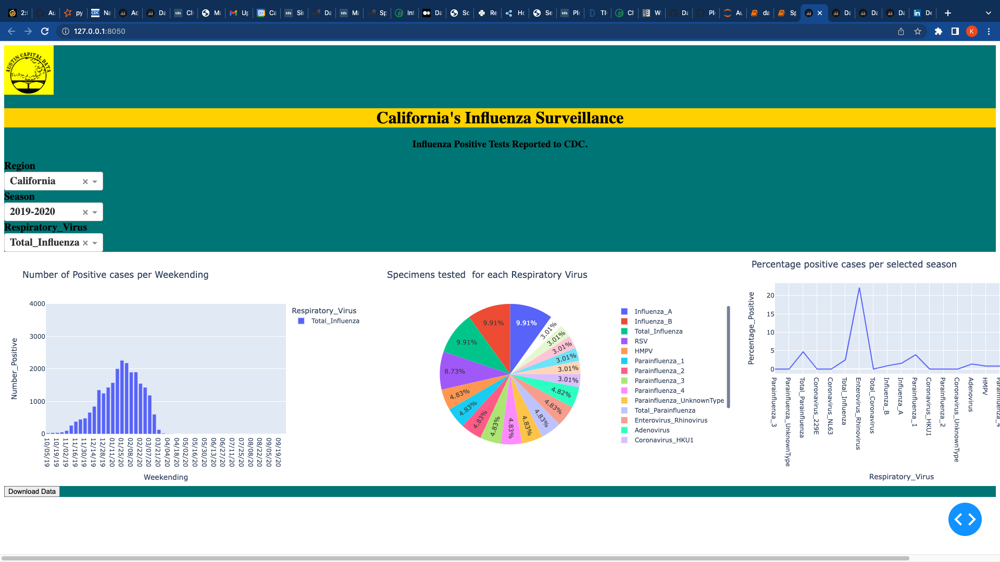

In [58]:

app = JupyterDash(__name__)

#---------------------------------------------------------------
#Taken from https://opendata.cityofnewyork.us/
df = influenza_psdf.to_pandas()
#---------------------------------------------------------------
app.layout = html.Div([

    html.Div([
        dcc.Graph(id='our_graph')
    ],className='nine columns'),

    html.Div([

        html.Br(),
        html.Div(id='output_data'),
        html.Br(),

        html.Label(['Choose column:'],style={'font-weight': 'bold', "text-align": "center"}),

        dcc.Dropdown(id='my_dropdown',
            options=[{'label':x, 'value':x} for x in df.sort_values('Region')['Region'].unique()],
                     
           optionHeight=35,                    #height/space between dropdown options
            value='California',                    #dropdown value selected automatically when page loads
            disabled=False,                     #disable dropdown value selection
            multi=False,                        #allow multiple dropdown values to be selected
            searchable=True,                    #allow user-searching of dropdown values
            search_value='',                    #remembers the value searched in dropdown
            placeholder='Please select...',     #gray, default text shown when no option is selected
            clearable=True,                     #allow user to removes the selected value
            style={'width':"100%"},             #use dictionary to define CSS styles of your dropdown
            # className='select_box',           #activate separate CSS document in assets folder
            # persistence=True,                 #remembers dropdown value. Used with persistence_type
            # persistence_type='memory'         #remembers dropdown value selected until...
            ),                                  #'memory': browser tab is refreshed
                                                #'session': browser tab is closed
                                                #'local': browser cookies are deleted
    ],className='three columns'),
    html.Div([

        html.Br(),
        html.Div(id='output_data2'),
        html.Br(),

        html.Label(['Choose column:'],style={'font-weight': 'bold', "text-align": "center"}),

        dcc.Dropdown(id='my_dropdown1',
            options=[{'label':x, 'value':x} for x in df.sort_values('Season')['Season'].unique()],
                     
           optionHeight=35,                    #height/space between dropdown options
            value='2009-2010',                    #dropdown value selected automatically when page loads
            disabled=False,                     #disable dropdown value selection
            multi=False,                        #allow multiple dropdown values to be selected
            searchable=True,                    #allow user-searching of dropdown values
            search_value='',                    #remembers the value searched in dropdown
            placeholder='Please select...',     #gray, default text shown when no option is selected
            clearable=True,                     #allow user to removes the selected value
            style={'width':"100%"},             #use dictionary to define CSS styles of your dropdown
            # className='select_box',           #activate separate CSS document in assets folder
            # persistence=True,                 #remembers dropdown value. Used with persistence_type
            # persistence_type='memory'         #remembers dropdown value selected until...
            ),                                  #'memory': browser tab is refreshed
                                                #'session': browser tab is closed
                                                #'local': browser cookies are deleted
    ],className='three columns'),   
    
]
)

#---------------------------------------------------------------
# Connecting the Dropdown values to the graph
@app.callback(
    Output(component_id='our_graph', component_property='figure'),
    [Input(component_id='my_dropdown', component_property='value'),Input(component_id='my_dropdown1', component_property='value')]
)

def build_graph(col1,col2):
    dff = df[df.Region.isin([col1])]
    dff=dff[dff.Season.isin([col2])]
    fig=px.pie(dff, values='Specimens_Tested', names='Respiratory_Virus', title='Specimens tested  for each Respiratory Virus')
       
    #fig.update_traces(textinfo='percent+label')
    #fig.update_layout(title={'text':'NYC Calls for Animal Rescue',
                      #'font':{'size':28},'x':0.5,'xanchor':'center'})
    return fig



if __name__ == '__main__':
    app.run_server(debug=True)


/opt/anaconda3/lib/python3.9/site-packages/pyspark/pandas/utils.py:975: PandasAPIOnSparkAdviceWarning:

`to_pandas` loads all data into the driver's memory. It should only be used if the resulting pandas DataFrame is expected to be small.



Dash app running on http://127.0.0.1:8050/


#### Deploying Dash Dashboard On AWS server(Ec2 server):
1. Create instance for almalinux location:aws-marketplace/AlmaLinux OS 8.6.20220901 x86_64-c076b20a-2305-4771-823f-944909847a05(It's free tier instance)
2. Navigate to Roles in the left side menu, and then select Create role. This starts a wizard workflow to create a new role.
3. Select AWS services and EC2 and click next.
4. Add permission policies as AdministrationAccess
5. Give valid name to role and create role.
6. Navigate to security and create security group.
  - Go to instance summary and click on Security.
  - click on Security group option and click on link below to edit inbound rules.
  - Add new inbound rules using Custom TCP to 8050 for Dash Server.   

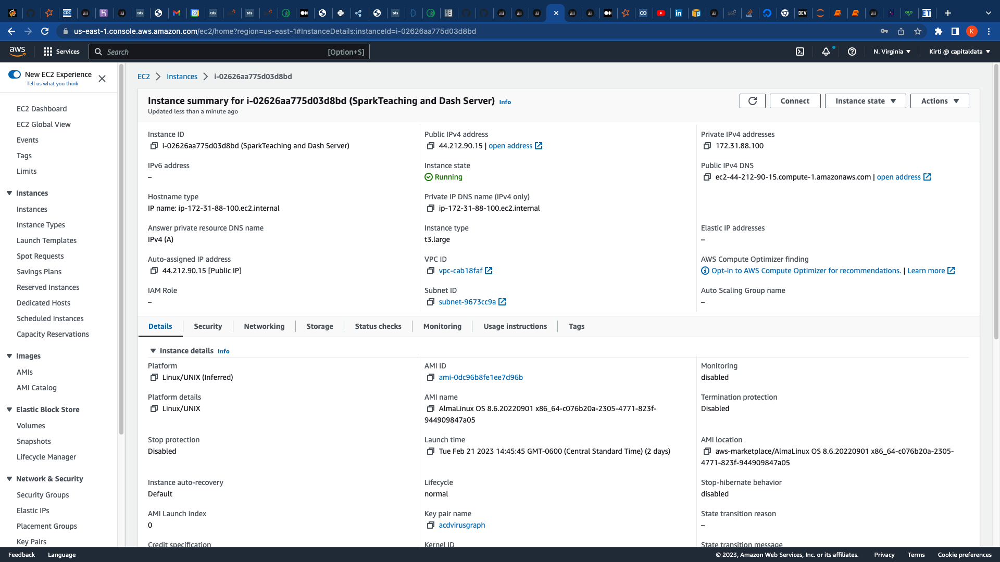

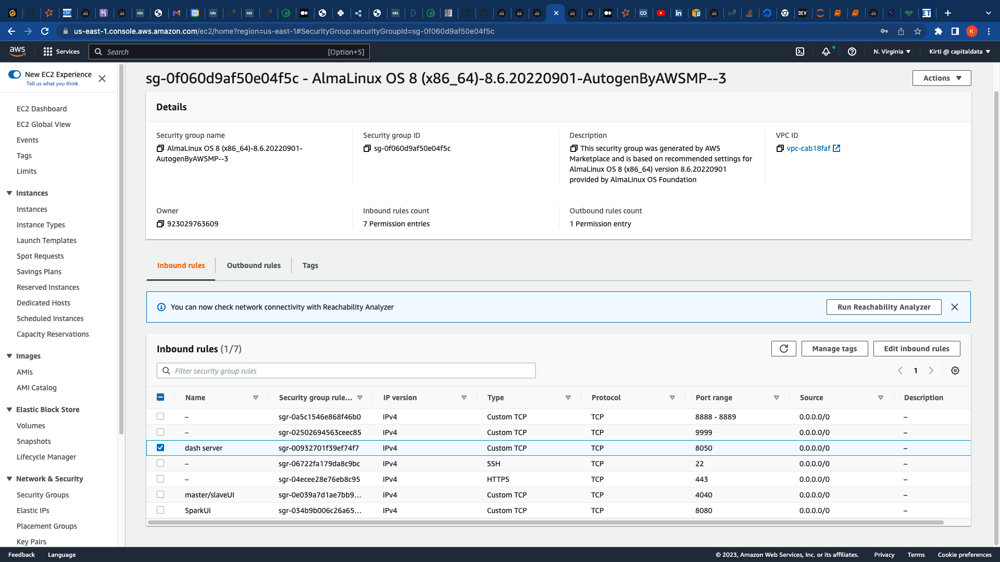

7. Connect instance with ssh client using command line terminal with following command:
   - base) kirtikamerkar@Kirtis-MBP .ssh % ssh -i "acdvirusgraph.pem" ec2-user@ec2-44-212-90-15.compute-1.amazonaws.com
8. Install required softwares on server.To install the packages it will use "yum" package install manager for Almalinux
   - By update and upgrading the server you will get the latest packages and versions to install in the server.
   - sudo yum update  
   - Install java,python,spark and anaconda on your ec2 server
9. Make one change in your code at the end of the code that is
   - if __name__ == '__main__':
   - app.run(host='0.0.0.0', port=8050)
   - If you are not planning the attach the web app to a domain name, you need to tell the dash web app server to run on 0.0.0.0 instead of localhost. This is to ensure that the app can be accessed from anywhere by http://EC2 IP:PORT. 
10. Run your code through jupyter notebook.And open link as  
    - http://ec2-44-212-90-15.compute-1.amazonaws.com:8050/

In [ ]:
#EC2 server code
app = JupyterDash(__name__)
df=influenza_psdf.to_pandas()
image_path='/Users/kirtikamerkar/Austincapitaldata/virusgraph/assets/ACD.png'
pil_image = Image.open(image_path)
# Creating layout
app.layout = html.Div(style={'backgroundColor':'teal'},children=[
    html.Div(html.Img(src=pil_image,style={'height':'1%','width':'5%','backgroundColor':'yellow'})),
    html.H1(children="California's Influenza Surveillance",
           style={'textAlign':'center','backgroundColor':'gold'}),

    html.Div(children=[html.H3(children='''
        Influenza Positive Tests Reported to CDC.
    ''',
    style={
            'textAlign': 'center','font':50
        }),
    #Calling data from region column
    html.Div([
      "Region",
       dcc.Dropdown(id="dropdown1",
       options=[{'label':x, 'value':x} for x in df.sort_values('Region')['Region'].unique()],optionHeight=35,
       value='California')],style={'color': 'black', 'font-size':20,"width": "10%","font-weight": "bold"})]),
        
    #Calling data from season column
    html.Div([
       "Season",
       dcc.Dropdown(id="dropdown2",
       options=[{'label':x, 'value':x} for x in df.sort_values('Season')['Season'].unique()],optionHeight=35,
       value='2019-2020')],style={'color':'black', 'font-size':20,"width": "10%","font-weight": "bold"}),
    #Calling data from respiratory_virus column
    html.Div([
       "Respiratory_Virus",
       dcc.Dropdown(id="dropdown3",
       options=[{'label':x, 'value':x} for x in df.sort_values('Respiratory_Virus')['Respiratory_Virus'].unique()],optionHeight=35,
       value='Total_Influenza')],
    style={'color': 'back', 'font-size': 20,"width": "10%","font-weight": "bold"}),
    
     html.Div(className='row',style={'display':'flex'},children=[
    html.Div(
        dcc.Graph(id='barchart',figure={}),
         className='six columns'),
    html.Div(
        dcc.Graph(id='piechart',figure={})
      ,className='six columns'),
     html.Div(
        dcc.Graph(id='linechart',figure={})
      ,className='six columns')]),

    html.Div([
    html.Button("Download Data", id="btn-download"),
    dcc.Download(id="download-data")
])
    
])
@app.callback(
    Output('barchart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     Input('dropdown3','value')],
    )

def build_graph(reg_v, season_v, virus_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)&(df['Respiratory_Virus']==virus_v)]

    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
    if virus_v:
        dff=dff[dff.Respiratory_Virus.isin([virus_v])]
    
        fig= px.bar(dff,"Weekending","Number_Positive",
               color ='Respiratory_Virus',
               animation_frame ='Season',
                hover_name ='Region', 
                range_y =[0, 4000],title='Number of Positive cases per Weekending')
    else:
          fig=px.bar(df,"Weekending","Number_Positive",
             color ='Respiratory_Virus',
             animation_frame ='Season',
             hover_name ='Region', 
             range_y =[0, 4000])
    return fig

@app.callback(
    Output('piechart','figure'),
    [Input('dropdown1','value'),
     Input('dropdown2','value'),
     ]
)  
def build_graph2(reg_v,season_v):
    dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
    if reg_v:
        dff = dff[dff.Region==reg_v]    
    if season_v:
        dff = dff[dff.Season.isin([season_v])]
        
        dff = df[(df['Season']==season_v)&(df['Region']==reg_v)]
        fig2=px.pie(dff, values='Specimens_Tested', names='Respiratory_Virus', title='Specimens tested  for each Respiratory Virus')
    return fig2
@app.callback(
    Output('linechart','figure'),Input('dropdown2','value')
)

def build_graph3(season_v):
    dff = influenza_psdf.pivot(index="Respiratory_Virus",columns="Season",values="Percent_Positive")
    dff=dff.fillna(0)
    dff=dff.to_pandas().loc[~(dff.to_pandas()==0).all(axis=1)]
    #figp=influenza_pivot[["2009-2010"]].plot().update_layout(yaxis_title="Number Of Positive Cases")
    if season_v:
        fig3=dff[[season_v]].plot().update_layout(yaxis_title="Percentage_Positive",title='Percentage positive cases per selected season')
    return fig3

@app.callback(
    Output("download-data", "data"),
    Input("btn-download", "n_clicks"),
    prevent_initial_call=True,)    

def func(n_clicks):
    return dcc.send_data_frame(df.to_csv, "mydf.csv")
if __name__ == '__main__':
    app.run(host='0.0.0.0', port=8050)

##### How to make your dahboard alive when you will be offline?
- Solution for this use nohup command.
- Instead of streaming data from pandas api on spark ,we can use pandas api through jupyter notebook or python code.
- In your SSH shell, enter the following command to start the Jupyter notebook server in the background:
  - !nohup jupyter notebook &
  - Press enter to move to a clean command prompt, and tail the notebook's log file to watch for when the notebook is ready to connect to:
  - tail -f nohup.out
  - jupyter notebook will start
- Run your code and open link:  http://ec2-44-212-90-15.compute-1.amazonaws.com:8050/  

In [18]:
import requests,json
url='https://www.bv-brc.org/api/surveillance'
response = (requests.get(url).text)
response_json = json.loads(response)
#cdf=pd.('https://www.bv-brc.org/api/surveillance')
#cdf.head()

jdf=pd.DataFrame(response_json)
jdf

,collection_city,collection_country,collection_date,collection_latitude,collection_longitude,collection_state_province,collector_institution,contact_email_address,date_inserted,date_modified,...,sample_identifier,sample_material,submission_date,taxon_lineage_ids,collection_year,_version_,host_id_type,host_sex,strain,pathogen_type
0,Sentinel Duck Farm A,China,2014-07-06T00:00:00Z,29.170000,116.220000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,529792,Cloacal,2016-08-30T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2014,1721454593573912600,NaN,NaN,NaN,NaN
1,"Guangzhou market, Guangzhou",China,2018-01-21T00:00:00Z,23.170000,113.230000,Guangdong,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,GZP_2018_301,Tracheal swab,2019-05-17T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2018,1721454593574961200,NaN,NaN,NaN,NaN
2,NaN,United States Of America,2019-07-10T00:00:00Z,NaN,NaN,California,Marine Mammal Center-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:36:09.384Z,2021-05-27T20:36:09.384Z,...,CSL-14551-RS,Rectal swab,NaN,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2019,1721454593574961200,NaN,NaN,NaN,NaN
3,Phnom Penh,Cambodia,2009-09-23T00:00:00Z,11.552490,104.931500,Phnom Penh,Wildlife Conservation Society,mceirs@umn.edu,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,KH09-A-0975-C2,Cloacal,2013-01-03T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2009,1721454593576009700,NaN,NaN,NaN,NaN
4,"Poyang Lake, Nanchang",China,2019-11-05T00:00:00Z,29.160000,116.360000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,JXWB_2019_34083,Feces,2020-11-19T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2019,1721454593576009700,NaN,NaN,NaN,NaN
5,"Poyang Lake, Nanchang",China,2018-02-01T00:00:00Z,29.160000,116.360000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,JXWB_2018_6622,Feces,2019-05-17T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2018,1721454593577058300,NaN,NaN,NaN,NaN
6,"Cordova Fishing Dock, Cordova",USA,2016-09-29T00:00:00Z,60.548115,-145.768080,Alaska,Tufts University-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,16MB03786,Feces,2017-06-08T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2016,1721454593577058300,MIT ID,NaN,NaN,NaN
7,Bani Suef,Egypt,2012-02-21T00:00:00Z,29.040000,31.050000,Beni Suef,"National Research Centre, Egypt",fluquery@yahoo.com,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,307685,Oral-pharyngeal swab,2013-10-25T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2012,1721454593577058300,NaN,NaN,NaN,NaN
8,Parches,Romania,2012-08-16T00:00:00Z,45.210000,28.580000,Tulcea,"CHPPH, University of Babes-Bolyai, Romania",fluquery@yahoo.com,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,325670,Oral-pharyngeal swab,2013-10-25T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2012,1721454593578107000,NaN,Male,NaN,NaN
9,NaN,Sri Lanka,2013-05-27T00:00:00Z,NaN,NaN,Western,"University of Kelaniya, Sri Lanka (via HKU)",fluquery@yahoo.com,2021-05-27T20:36:09.384Z,2021-05-27T20:36:09.384Z,...,429780,Tracheal swab,NaN,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2013,1721454593578107000,NaN,NaN,NaN,NaN


In [2]:
import pandas as pd
import requests,json
url='https://www.bv-brc.org/api/surveillance'
response = (requests.get(url).text)
response_json = json.loads(response)
#cdf=pd.('https://www.bv-brc.org/api/surveillance')
#cdf.head()

jdf=pd.DataFrame(response_json)
jdf

,collection_city,collection_country,collection_date,collection_latitude,collection_longitude,collection_state_province,collector_institution,contact_email_address,date_inserted,date_modified,...,sample_identifier,sample_material,submission_date,taxon_lineage_ids,collection_year,_version_,host_id_type,host_sex,strain,pathogen_type
0,Sentinel Duck Farm A,China,2014-07-06T00:00:00Z,29.170000,116.220000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,529792,Cloacal,2016-08-30T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2014,1721454593573912600,NaN,NaN,NaN,NaN
1,"Guangzhou market, Guangzhou",China,2018-01-21T00:00:00Z,23.170000,113.230000,Guangdong,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,GZP_2018_301,Tracheal swab,2019-05-17T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2018,1721454593574961200,NaN,NaN,NaN,NaN
2,NaN,United States Of America,2019-07-10T00:00:00Z,NaN,NaN,California,Marine Mammal Center-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:36:09.384Z,2021-05-27T20:36:09.384Z,...,CSL-14551-RS,Rectal swab,NaN,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2019,1721454593574961200,NaN,NaN,NaN,NaN
3,Phnom Penh,Cambodia,2009-09-23T00:00:00Z,11.552490,104.931500,Phnom Penh,Wildlife Conservation Society,mceirs@umn.edu,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,KH09-A-0975-C2,Cloacal,2013-01-03T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2009,1721454593576009700,NaN,NaN,NaN,NaN
4,"Poyang Lake, Nanchang",China,2019-11-05T00:00:00Z,29.160000,116.360000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,JXWB_2019_34083,Feces,2020-11-19T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2019,1721454593576009700,NaN,NaN,NaN,NaN
5,"Poyang Lake, Nanchang",China,2018-02-01T00:00:00Z,29.160000,116.360000,Jiangxi,University of Hong Kong-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,JXWB_2018_6622,Feces,2019-05-17T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2018,1721454593577058300,NaN,NaN,NaN,NaN
6,"Cordova Fishing Dock, Cordova",USA,2016-09-29T00:00:00Z,60.548115,-145.768080,Alaska,Tufts University-CEIRS2,irdsupport@niaidceirs.org,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,16MB03786,Feces,2017-06-08T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2016,1721454593577058300,MIT ID,NaN,NaN,NaN
7,Bani Suef,Egypt,2012-02-21T00:00:00Z,29.040000,31.050000,Beni Suef,"National Research Centre, Egypt",fluquery@yahoo.com,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,307685,Oral-pharyngeal swab,2013-10-25T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2012,1721454593577058300,NaN,NaN,NaN,NaN
8,Parches,Romania,2012-08-16T00:00:00Z,45.210000,28.580000,Tulcea,"CHPPH, University of Babes-Bolyai, Romania",fluquery@yahoo.com,2021-05-27T20:38:36.497Z,2021-05-27T20:38:36.497Z,...,325670,Oral-pharyngeal swab,2013-10-25T00:00:00Z,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2012,1721454593578107000,NaN,Male,NaN,NaN
9,NaN,Sri Lanka,2013-05-27T00:00:00Z,NaN,NaN,Western,"University of Kelaniya, Sri Lanka (via HKU)",fluquery@yahoo.com,2021-05-27T20:36:09.384Z,2021-05-27T20:36:09.384Z,...,429780,Tracheal swab,NaN,"[10239, 2559587, 2732396, 2497569, 2497571, 24...",2013,1721454593578107000,NaN,NaN,NaN,NaN


In [4]:
cdf=pd.read_csv('https://www.bv-brc.org/api/surveillance')
cdf

,project_identifier,contributing_institution,sample_identifier,sequence_accession,sample_material,sample_transport_medium,sample_receipt_date,submission_date,last_update_date,longitudinal_study,...,treatment_dosage,vaccination_type,days_elapsed_to_vaccination,source_of_vaccine_information,vaccine_lot_number,vaccine_manufacturer,vaccine_dosage,other_vaccinations,additional_metadata,comments
0,NaN,NaN,529792,NaN,Cloacal,NaN,NaN,2016-08-30T00:00:00Z,2017-03-02T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,GZP_2018_301,NaN,Tracheal swab,NaN,NaN,2019-05-17T00:00:00Z,2021-01-12T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,CSL-14551-RS,NaN,Rectal swab,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,KH09-A-0975-C2,NaN,Cloacal,NaN,NaN,2013-01-03T00:00:00Z,2013-01-03T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,JXWB_2019_34083,NaN,Feces,NaN,NaN,2020-11-19T00:00:00Z,2020-11-19T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,NaN,NaN,JXWB_2018_6622,NaN,Feces,NaN,NaN,2019-05-17T00:00:00Z,2019-05-17T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,NaN,NaN,16MB03786,NaN,Feces,NaN,NaN,2017-06-08T00:00:00Z,2017-06-08T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,NaN,NaN,307685,NaN,Oral-pharyngeal swab,NaN,NaN,2013-10-25T00:00:00Z,2013-10-25T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,NaN,NaN,325670,NaN,Oral-pharyngeal swab,NaN,NaN,2013-10-25T00:00:00Z,2013-10-25T00:00:00Z,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,NaN,NaN,429780,NaN,Tracheal swab,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### References:
- https://towardsdatascience.com/plotting-maps-with-geopandas-428c97295a73
- https://dash.plotly.com/dash-core-components
- https://github.com/Coding-with-Adam/Dash-by-Plotly
- https://www.linkedin.com/pulse/deploy-python-dashboard-aws-sreejith-munthikodu
- https://dev.to/aws-builders/start-a-jupyter-notebook-server-ke4